In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
!git clone https://github.com/open-mmlab/mmsegmentation.git

Looking in links: https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
     |████████████████████████████████| 46.6 MB 82 kB/s 
     |████████████████████████████████| 190 kB 5.1 MB/s 
Cloning into 'mmsegmentation'...
remote: Enumerating objects: 7020, done.
remote: Counting objects: 100% (32/32), done.
remote: Compressing objects: 100% (26/26), done.
remote: Total 7020 (delta 9), reused 22 (delta 6), pack-reused 6988
Receiving objects: 100% (7020/7020), 13.03 MiB | 36.96 MiB/s, done.
Resolving deltas: 100% (5197/5197), done.


In [3]:
import torch

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 1.11.0+cu113 (Tesla P100-PCIE-16GB)


In [4]:
%cd mmsegmentation

/content/mmsegmentation


In [5]:
from mmseg.apis import inference_segmentor, init_segmentor, show_result_pyplot
import mmcv

In [6]:
import os.path as osp
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

In [7]:
!mkdir checkpoints
!wget -O //content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth https://download.openmmlab.com/mmsegmentation/v0.5/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth

--2022-05-19 01:15:55--  https://download.openmmlab.com/mmsegmentation/v0.5/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.252.96.28
Connecting to download.openmmlab.com (download.openmmlab.com)|47.252.96.28|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 328290585 (313M) [application/octet-stream]
Saving to: ‘//content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth’

//content/mmsegment 100%[===================>] 313.08M  8.75MB/s    in 37s     

2022-05-19 01:16:33 (8.52 MB/s) - ‘//content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth’ saved [328290585/328290585]



In [8]:
from mmseg.datasets.builder import DATASETS
from mmseg.datasets.custom import CustomDataset

classes = ('background', 'building', 'road')
palette = [[0, 0, 0], [128, 128, 0], [255, 255, 0]]

@DATASETS.register_module()
class SIADataset(CustomDataset):
  CLASSES = classes
  PALETTE = palette
  def __init__(self, split, **kwargs):
    super().__init__(img_suffix='.png', seg_map_suffix='.png', 
                     split=split, **kwargs)
    assert osp.exists(self.img_dir) and self.split is not None

In [9]:
# config 파일을 설정하고, 다운로드 받은 pretrained 모델을 checkpoint로 설정. 
config_file = '/content/mmsegmentation/configs/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes.py'
checkpoint_file = '/content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth'

from mmcv import Config

cfg = Config.fromfile(config_file)
print(cfg.pretty_text)

norm_cfg = dict(type='SyncBN', requires_grad=True)
model = dict(
    type='EncoderDecoder',
    pretrained=None,
    backbone=dict(
        type='MixVisionTransformer',
        in_channels=3,
        embed_dims=64,
        num_stages=4,
        num_layers=[3, 6, 40, 3],
        num_heads=[1, 2, 5, 8],
        patch_sizes=[7, 3, 3, 3],
        sr_ratios=[8, 4, 2, 1],
        out_indices=(0, 1, 2, 3),
        mlp_ratio=4,
        qkv_bias=True,
        drop_rate=0.0,
        attn_drop_rate=0.0,
        drop_path_rate=0.1,
        init_cfg=dict(type='Pretrained', checkpoint='pretrain/mit_b5.pth')),
    decode_head=dict(
        type='SegformerHead',
        in_channels=[64, 128, 320, 512],
        in_index=[0, 1, 2, 3],
        channels=256,
        dropout_ratio=0.1,
        num_classes=19,
        norm_cfg=dict(type='SyncBN', requires_grad=True),
        align_corners=False,
        loss_decode=dict(
            type='CrossEntropyLoss', use_sigmoid=False, loss_weight=1.0)),
    train_cf

In [10]:
model = dict(
    type='EncoderDecoder',
    pretrained='open-mmlab://resnet101_v1c',
    backbone=dict(
        type='ResNetV1c',
        depth=101,
        num_stages=4,
        out_indices=(0, 1, 2, 3),
        dilations=(1, 1, 1, 1),
        strides=(1, 2, 2, 2),
        norm_cfg=dict(type='BN', requires_grad=True),
        norm_eval=False,
        style='pytorch',
        contract_dilation=True),
    neck=dict(
        type='FPN',
        in_channels=[256, 512, 1024, 2048],
        out_channels=256,
        num_outs=4),
    decode_head=dict(
        type='FPNHead',
        in_channels=[256, 256, 256, 256],
        in_index=[0, 1, 2, 3],
        feature_strides=[4, 8, 16, 32],
        channels=128,
        dropout_ratio=0.1,
        num_classes=19,
        norm_cfg=dict(type='BN', requires_grad=True),
        align_corners=False,
        loss_decode=dict(
            type='CrossEntropyLoss', use_sigmoid=False, loss_weight=1.0)),
    train_cfg=dict(),
    test_cfg=dict(mode='whole'))

In [11]:
img_norm_cfg = dict(
    mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)
crop_size = (512, 512)
train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations'),
    dict(type='Resize', img_scale=(1024, 1024), ratio_range=(0.5, 1.5)),
    dict(type='RandomCrop', crop_size=(512, 512), cat_max_ratio=0.75),
    dict(type='RandomFlip', prob=0.5),
    dict(type='PhotoMetricDistortion'),
    dict(
        type='Normalize',
        mean=[123.675, 116.28, 103.53],
        std=[58.395, 57.12, 57.375],
        to_rgb=True),
    dict(type='Pad', size=(512, 512), pad_val=0, seg_pad_val=255),
    dict(type='DefaultFormatBundle'),
    dict(type='Collect', keys=['img', 'gt_semantic_seg'])
]
test_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(
        type='MultiScaleFlipAug',
        img_scale=(1024, 1024),
        flip=False,
        transforms=[
            dict(type='Resize', keep_ratio=True),
            dict(type='RandomFlip'),
            dict(
                type='Normalize',
                mean=[123.675, 116.28, 103.53],
                std=[58.395, 57.12, 57.375],
                to_rgb=True),
            dict(type='ImageToTensor', keys=['img']),
            dict(type='Collect', keys=['img'])
        ])
]

In [12]:
dataset_type = 'CityscapesDataset'
data_root = 'data/cityscapes/'

data = dict(
    samples_per_gpu=2,  #batch size
    workers_per_gpu=2,  
    train=dict(
        type='CityscapesDataset',
        data_root='data/cityscapes/',
        img_dir='leftImg8bit/train',
        ann_dir='gtFine/train',
        pipeline=[
            dict(type='LoadImageFromFile'),
            dict(type='LoadAnnotations'),
            dict(
                type='Resize', img_scale=(1024, 1024), ratio_range=(0.5, 1.5)),
            dict(type='RandomCrop', crop_size=(512, 512), cat_max_ratio=0.75),
            dict(type='RandomFlip', prob=0.5),
            dict(type='PhotoMetricDistortion'),
            dict(
                type='Normalize',
                mean=[123.675, 116.28, 103.53],
                std=[58.395, 57.12, 57.375],
                to_rgb=True),
            dict(type='Pad', size=(512, 512), pad_val=0, seg_pad_val=255),
            dict(type='DefaultFormatBundle'),
            dict(type='Collect', keys=['img', 'gt_semantic_seg'])
        ]),
    val=dict(
        type='CityscapesDataset',
        data_root='data/cityscapes/',
        img_dir='leftImg8bit/val',
        ann_dir='gtFine/val',
        pipeline=[
            dict(type='LoadImageFromFile'),
            dict(
                type='MultiScaleFlipAug',
                img_scale=(1024, 1024),
                flip=False,
                transforms=[
                    dict(type='Resize', keep_ratio=True),
                    dict(type='RandomFlip'),
                    dict(
                        type='Normalize',
                        mean=[123.675, 116.28, 103.53],
                        std=[58.395, 57.12, 57.375],
                        to_rgb=True),
                    dict(type='ImageToTensor', keys=['img']),
                    dict(type='Collect', keys=['img'])
                ])
        ]),
    test=dict(
        type='CityscapesDataset',
        data_root='data/cityscapes/',
        img_dir='leftImg8bit/val',
        ann_dir='gtFine/val',
        pipeline=[
            dict(type='LoadImageFromFile'),
            dict(
                type='MultiScaleFlipAug',
                img_scale=(1024, 1024),
                flip=False,
                transforms=[
                    dict(type='Resize', keep_ratio=True),
                    dict(type='RandomFlip'),
                    dict(
                        type='Normalize',
                        mean=[123.675, 116.28, 103.53],
                        std=[58.395, 57.12, 57.375],
                        to_rgb=True),
                    dict(type='ImageToTensor', keys=['img']),
                    dict(type='Collect', keys=['img'])
                ])
        ]))

In [13]:
cfg.norm_cfg = dict(type='BN', requires_grad=True)
#cfg.model.backbone.norm_cfg = cfg.norm_cfg
cfg.model.decode_head.norm_cfg = cfg.norm_cfg

cfg.model.decode_head.num_classes = 3

cfg.model.decode_head.loss_decode = dict(type='FocalLoss', loss_weight = 1.0)

In [14]:
cfg.img_norm_cfg = dict(
    mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)
cfg.crop_size = (512, 512)
cfg.train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations'),
    dict(type='Resize', img_scale=(1024, 1024), ratio_range=(0.5, 1.5)),
    dict(type='RandomCrop', crop_size=cfg.crop_size, cat_max_ratio=0.75),
    dict(type='RandomFlip', flip_ratio=0.5),
    dict(type='PhotoMetricDistortion'),
    dict(type='Normalize', **cfg.img_norm_cfg),
    dict(type='Pad', size=cfg.crop_size, pad_val=0, seg_pad_val=255),
    dict(type='DefaultFormatBundle'),
    dict(type='Collect', keys=['img', 'gt_semantic_seg']),
]

cfg.test_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(
        type='MultiScaleFlipAug',
        img_scale=(1024, 1024),
        # img_ratios=[0.5, 0.75, 1.0, 1.25, 1.5, 1.75],
        flip=False,
        transforms=[
            dict(type='Resize', keep_ratio=True),
            dict(type='RandomFlip'),
            dict(type='Normalize', **cfg.img_norm_cfg),
            dict(type='ImageToTensor', keys=['img']),
            dict(type='Collect', keys=['img']),
        ])
]

In [15]:
cfg.dataset_type = 'SIADataset'
cfg.data_root = '/content/drive/MyDrive/SIA'

cfg.data.train.type = 'SIADataset'
cfg.data.train.data_root = '/content/drive/MyDrive/SIA'
cfg.data.train.img_dir = 'Data_set/road_dataset/img_dir/train'
cfg.data.train.ann_dir = 'Data_set/road_dataset/ann_dir/train'
cfg.data.train.pipeline = cfg.train_pipeline
cfg.data.train.split = '/content/drive/MyDrive/SIA/Data_set/road_dataset/mask_dir/train/up_train_road.txt'

cfg.data.val.type = 'SIADataset'
cfg.data.val.data_root = '/content/drive/MyDrive/SIA'
cfg.data.val.img_dir = 'Data_set/road_dataset/img_dir/train'
cfg.data.val.ann_dir = 'Data_set/road_dataset/ann_dir/train'
cfg.data.val.pipeline = cfg.test_pipeline
cfg.data.val.split = '/content/drive/MyDrive/SIA/Data_set/road_dataset/mask_dir/train/up_val_road.txt'

cfg.data.test.type = 'SIADataset'
cfg.data.test.data_root = '/content/drive/MyDrive/SIA'
cfg.data.test.img_dir = 'Data_set/road_dataset/img_dir/val'
cfg.data.test.ann_dir = 'Data_set/road_dataset/ann_dir/val'
cfg.data.test.pipeline = cfg.test_pipeline
cfg.data.test.split = '/content/drive/MyDrive/SIA/Data_set/road_dataset/mask_dir/val/up.txt'

In [16]:
'''
cfg.data.train.type = 'SIADataset'
cfg.data.train.data_root = '/content/drive/MyDrive/SIA'
cfg.data.train.img_dir = 'images/up025'
cfg.data.train.ann_dir = 'labels'
cfg.data.train.pipeline = cfg.train_pipeline
cfg.data.train.split = '/content/drive/MyDrive/SIA/splits/road/train_road.txt'
'''

"\ncfg.data.train.type = 'SIADataset'\ncfg.data.train.data_root = '/content/drive/MyDrive/SIA'\ncfg.data.train.img_dir = 'images/up025'\ncfg.data.train.ann_dir = 'labels'\ncfg.data.train.pipeline = cfg.train_pipeline\ncfg.data.train.split = '/content/drive/MyDrive/SIA/splits/road/train_road.txt'\n"

In [17]:
cfg.load_from = '/content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth'

# Set up working dir to save files and logs.
cfg.work_dir = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/focal'

In [18]:
cfg.runner.max_iteTrs = 200
cfg.log_config.interval = 100
cfg.evaluation.interval = 1000  # 모델 학습시 평가를 몇 번째 iteration마다 할 것인지 지정
cfg.checkpoint_config.interval = 1000  # 모델 학습시 학습한 모델을 몇 번째 iteration마다 저장할 것인지 지정

cfg.runner = dict(type='IterBasedRunner', max_iters=20000)  # Iteration으로 동작, Epoch로 동작하게 변경할 수도 있음
# cfg.runner = dict(type='EpochBasedRunner', max_epochs=4000)  # Epoch로 변경
cfg.workflow = [('train', 1)]

# Set seed to facitate reproducing the result
cfg.seed = 0
#set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)

# Let's have a look at the final config used for training
print(f'Config:\n{cfg.pretty_text}')

Config:
norm_cfg = dict(type='BN', requires_grad=True)
model = dict(
    type='EncoderDecoder',
    pretrained=None,
    backbone=dict(
        type='MixVisionTransformer',
        in_channels=3,
        embed_dims=64,
        num_stages=4,
        num_layers=[3, 6, 40, 3],
        num_heads=[1, 2, 5, 8],
        patch_sizes=[7, 3, 3, 3],
        sr_ratios=[8, 4, 2, 1],
        out_indices=(0, 1, 2, 3),
        mlp_ratio=4,
        qkv_bias=True,
        drop_rate=0.0,
        attn_drop_rate=0.0,
        drop_path_rate=0.1,
        init_cfg=dict(type='Pretrained', checkpoint='pretrain/mit_b5.pth')),
    decode_head=dict(
        type='SegformerHead',
        in_channels=[64, 128, 320, 512],
        in_index=[0, 1, 2, 3],
        channels=256,
        dropout_ratio=0.1,
        num_classes=3,
        norm_cfg=dict(type='BN', requires_grad=True),
        align_corners=False,
        loss_decode=dict(type='FocalLoss', loss_weight=1.0)),
    train_cfg=dict(),
    test_cfg=dict(mode='slide'

### 모델 학습

In [19]:
from mmseg.datasets import build_dataset
from mmseg.models import build_segmentor
from mmseg.apis import train_segmentor

# Build the dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model = build_segmentor(
    cfg.model, train_cfg=cfg.get('train_cfg'), test_cfg=cfg.get('test_cfg'))

# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_segmentor(model, datasets, cfg, distributed=False, validate=True,
                meta=dict(CLASSES=classes, PALETTE=palette))

2022-05-19 01:16:36,826 - mmseg - INFO - Loaded 542 images
2022-05-19 01:16:50,811 - mmseg - INFO - Loaded 66 images
2022-05-19 01:16:50,815 - mmseg - INFO - load checkpoint from local path: /content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth
2022-05-19 01:16:51,336 - mmseg - WARNING - The model and loaded state dict do not match exactly

size mismatch for decode_head.conv_seg.weight: copying a param with shape torch.Size([19, 256, 1, 1]) from checkpoint, the shape in current model is torch.Size([3, 256, 1, 1]).
size mismatch for decode_head.conv_seg.bias: copying a param with shape torch.Size([19]) from checkpoint, the shape in current model is torch.Size([3]).
2022-05-19 01:16:51,346 - mmseg - INFO - Start running, host: root@f5cf13cb62da, work_dir: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/focal
2022-05-19 01:16:51,347 - mmseg - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 1.6 task/s, elapsed: 40s, ETA:     0s

2022-05-19 01:26:22,453 - mmseg - INFO - per class results:
2022-05-19 01:26:22,455 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.03 | 97.68 |
|  building  |  nan  |  nan  |
|    road    | 52.78 | 58.73 |
+------------+-------+-------+
2022-05-19 01:26:22,456 - mmseg - INFO - Summary:
2022-05-19 01:26:22,458 - mmseg - INFO - 
+-------+------+------+
|  aAcc | mIoU | mAcc |
+-------+------+------+
| 91.03 | 71.4 | 78.2 |
+-------+------+------+
2022-05-19 01:26:22,461 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9103, mIoU: 0.7140, mAcc: 0.7820, IoU.background: 0.9003, IoU.building: nan, IoU.road: 0.5278, Acc.background: 0.9768, Acc.building: nan, Acc.road: 0.5873
2022-05-19 01:27:04,106 - mmseg - INFO - Iter [1100/20000]	lr: 4.154e-05, eta: 2:55:26, time: 0.821, data_time: 0.432, memory: 3323, decode.loss_focal: 0.0232, decode.acc_seg: 89.7575, loss: 0.0232
2022-05-19 01:27:43,649 - mmseg - INFO - Iter [1200/

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.9 task/s, elapsed: 23s, ETA:     0s

2022-05-19 01:33:32,427 - mmseg - INFO - per class results:
2022-05-19 01:33:32,429 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.42 | 97.65 |
|  building  |  nan  |  nan  |
|    road    | 54.88 | 61.14 |
+------------+-------+-------+
2022-05-19 01:33:32,431 - mmseg - INFO - Summary:
2022-05-19 01:33:32,433 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 91.42 | 72.65 | 79.39 |
+-------+-------+-------+
2022-05-19 01:33:32,435 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9142, mIoU: 0.7265, mAcc: 0.7939, IoU.background: 0.9042, IoU.building: nan, IoU.road: 0.5488, Acc.background: 0.9765, Acc.building: nan, Acc.road: 0.6114
2022-05-19 01:34:11,953 - mmseg - INFO - Iter [2100/20000]	lr: 5.370e-05, eta: 2:27:49, time: 0.624, data_time: 0.235, memory: 3323, decode.loss_focal: 0.0215, decode.acc_seg: 90.3080, loss: 0.0215
2022-05-19 01:34:53,550 - mmseg - INFO - I

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.9 task/s, elapsed: 23s, ETA:     0s

2022-05-19 01:40:39,571 - mmseg - INFO - per class results:
2022-05-19 01:40:39,573 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.93 | 95.96 |
|  building  |  nan  |  nan  |
|    road    |  61.1 | 73.08 |
+------------+-------+-------+
2022-05-19 01:40:39,575 - mmseg - INFO - Summary:
2022-05-19 01:40:39,578 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.06 | 76.01 | 84.52 |
+-------+-------+-------+
2022-05-19 01:40:39,579 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9206, mIoU: 0.7601, mAcc: 0.8452, IoU.background: 0.9093, IoU.building: nan, IoU.road: 0.6110, Acc.background: 0.9596, Acc.building: nan, Acc.road: 0.7308
2022-05-19 01:41:19,261 - mmseg - INFO - Iter [3100/20000]	lr: 5.070e-05, eta: 2:13:21, time: 0.625, data_time: 0.235, memory: 3323, decode.loss_focal: 0.0191, decode.acc_seg: 91.3117, loss: 0.0191
2022-05-19 01:41:58,869 - mmseg - INFO - I

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.9 task/s, elapsed: 23s, ETA:     0s

2022-05-19 01:47:44,891 - mmseg - INFO - per class results:
2022-05-19 01:47:44,893 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.79 | 95.63 |
|  building  |  nan  |  nan  |
|    road    | 61.15 | 74.15 |
+------------+-------+-------+
2022-05-19 01:47:44,894 - mmseg - INFO - Summary:
2022-05-19 01:47:44,896 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 91.96 | 75.97 | 84.89 |
+-------+-------+-------+
2022-05-19 01:47:44,898 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9196, mIoU: 0.7597, mAcc: 0.8489, IoU.background: 0.9079, IoU.building: nan, IoU.road: 0.6115, Acc.background: 0.9563, Acc.building: nan, Acc.road: 0.7415
2022-05-19 01:48:24,129 - mmseg - INFO - Iter [4100/20000]	lr: 4.770e-05, eta: 2:02:19, time: 0.621, data_time: 0.236, memory: 3323, decode.loss_focal: 0.0182, decode.acc_seg: 91.6718, loss: 0.0182
2022-05-19 01:49:03,410 - mmseg - INFO - I

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.9 task/s, elapsed: 23s, ETA:     0s

2022-05-19 01:54:52,914 - mmseg - INFO - per class results:
2022-05-19 01:54:52,915 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.21 | 97.75 |
|  building  |  nan  |  nan  |
|    road    | 58.76 | 65.19 |
+------------+-------+-------+
2022-05-19 01:54:52,917 - mmseg - INFO - Summary:
2022-05-19 01:54:52,919 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.19 | 74.99 | 81.47 |
+-------+-------+-------+
2022-05-19 01:54:52,921 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9219, mIoU: 0.7499, mAcc: 0.8147, IoU.background: 0.9121, IoU.building: nan, IoU.road: 0.5876, Acc.background: 0.9775, Acc.building: nan, Acc.road: 0.6519
2022-05-19 01:55:32,977 - mmseg - INFO - Iter [5100/20000]	lr: 4.470e-05, eta: 1:53:02, time: 0.631, data_time: 0.238, memory: 3323, decode.loss_focal: 0.0180, decode.acc_seg: 91.6203, loss: 0.0180
2022-05-19 01:56:12,977 - mmseg - INFO - I

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.9 task/s, elapsed: 23s, ETA:     0s

2022-05-19 02:02:06,152 - mmseg - INFO - per class results:
2022-05-19 02:02:06,153 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.13 | 95.98 |
|  building  |  nan  |  nan  |
|    road    | 62.03 | 74.14 |
+------------+-------+-------+
2022-05-19 02:02:06,155 - mmseg - INFO - Summary:
2022-05-19 02:02:06,159 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.25 | 76.58 | 85.06 |
+-------+-------+-------+
2022-05-19 02:02:06,161 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9225, mIoU: 0.7658, mAcc: 0.8506, IoU.background: 0.9113, IoU.building: nan, IoU.road: 0.6203, Acc.background: 0.9598, Acc.building: nan, Acc.road: 0.7414
2022-05-19 02:02:46,329 - mmseg - INFO - Iter [6100/20000]	lr: 4.170e-05, eta: 1:44:37, time: 0.633, data_time: 0.239, memory: 3323, decode.loss_focal: 0.0162, decode.acc_seg: 92.3436, loss: 0.0162
2022-05-19 02:03:26,393 - mmseg - INFO - I

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.9 task/s, elapsed: 23s, ETA:     0s

2022-05-19 02:09:17,387 - mmseg - INFO - per class results:
2022-05-19 02:09:17,389 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.38 | 97.08 |
|  building  |  nan  |  nan  |
|    road    | 61.04 | 69.72 |
+------------+-------+-------+
2022-05-19 02:09:17,390 - mmseg - INFO - Summary:
2022-05-19 02:09:17,392 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 92.41 | 76.21 | 83.4 |
+-------+-------+------+
2022-05-19 02:09:17,395 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9241, mIoU: 0.7621, mAcc: 0.8340, IoU.background: 0.9138, IoU.building: nan, IoU.road: 0.6104, Acc.background: 0.9708, Acc.building: nan, Acc.road: 0.6972
2022-05-19 02:09:59,584 - mmseg - INFO - Iter [7100/20000]	lr: 3.870e-05, eta: 1:36:32, time: 0.652, data_time: 0.258, memory: 3323, decode.loss_focal: 0.0156, decode.acc_seg: 92.5716, loss: 0.0156
2022-05-19 02:10:39,605 - mmseg - INFO - Iter [

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.9 task/s, elapsed: 23s, ETA:     0s

2022-05-19 02:16:30,448 - mmseg - INFO - per class results:
2022-05-19 02:16:30,450 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.31 | 96.29 |
|  building  |  nan  |  nan  |
|    road    | 62.28 | 73.51 |
+------------+-------+-------+
2022-05-19 02:16:30,452 - mmseg - INFO - Summary:
2022-05-19 02:16:30,455 - mmseg - INFO - 
+------+------+------+
| aAcc | mIoU | mAcc |
+------+------+------+
| 92.4 | 76.8 | 84.9 |
+------+------+------+
2022-05-19 02:16:30,457 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9240, mIoU: 0.7680, mAcc: 0.8490, IoU.background: 0.9131, IoU.building: nan, IoU.road: 0.6228, Acc.background: 0.9629, Acc.building: nan, Acc.road: 0.7351
2022-05-19 02:17:10,486 - mmseg - INFO - Iter [8100/20000]	lr: 3.570e-05, eta: 1:28:36, time: 0.631, data_time: 0.238, memory: 3323, decode.loss_focal: 0.0151, decode.acc_seg: 92.9007, loss: 0.0151
2022-05-19 02:17:52,654 - mmseg - INFO - Iter [8200/20000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.9 task/s, elapsed: 23s, ETA:     0s

2022-05-19 02:23:42,718 - mmseg - INFO - per class results:
2022-05-19 02:23:42,720 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  91.2 | 95.74 |
|  building  |  nan  |  nan  |
|    road    | 62.81 |  75.8 |
+------------+-------+-------+
2022-05-19 02:23:42,721 - mmseg - INFO - Summary:
2022-05-19 02:23:42,724 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 92.34 | 77.0 | 85.77 |
+-------+------+-------+
2022-05-19 02:23:42,727 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9234, mIoU: 0.7700, mAcc: 0.8577, IoU.background: 0.9120, IoU.building: nan, IoU.road: 0.6281, Acc.background: 0.9574, Acc.building: nan, Acc.road: 0.7580
2022-05-19 02:24:22,914 - mmseg - INFO - Iter [9100/20000]	lr: 3.270e-05, eta: 1:20:52, time: 0.633, data_time: 0.238, memory: 3323, decode.loss_focal: 0.0153, decode.acc_seg: 92.8203, loss: 0.0153
2022-05-19 02:25:02,752 - mmseg - INFO - Iter [

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.6 task/s, elapsed: 25s, ETA:     0s

2022-05-19 02:30:56,846 - mmseg - INFO - per class results:
2022-05-19 02:30:56,848 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.27 | 96.23 |
|  building  |  nan  |  nan  |
|    road    | 62.19 | 73.58 |
+------------+-------+-------+
2022-05-19 02:30:56,849 - mmseg - INFO - Summary:
2022-05-19 02:30:56,851 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 92.36 | 76.73 | 84.9 |
+-------+-------+------+
2022-05-19 02:30:56,855 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9236, mIoU: 0.7673, mAcc: 0.8490, IoU.background: 0.9127, IoU.building: nan, IoU.road: 0.6219, Acc.background: 0.9623, Acc.building: nan, Acc.road: 0.7358
2022-05-19 02:31:36,612 - mmseg - INFO - Iter [10100/20000]	lr: 2.970e-05, eta: 1:13:16, time: 0.649, data_time: 0.258, memory: 3323, decode.loss_focal: 0.0141, decode.acc_seg: 93.2716, loss: 0.0141
2022-05-19 02:32:16,348 - mmseg - INFO - Iter 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.6 task/s, elapsed: 25s, ETA:     0s

2022-05-19 02:38:11,054 - mmseg - INFO - per class results:
2022-05-19 02:38:11,056 - mmseg - INFO - 
+------------+------+-------+
|   Class    | IoU  |  Acc  |
+------------+------+-------+
| background | 91.5 | 96.06 |
|  building  | nan  |  nan  |
|    road    | 63.6 | 75.78 |
+------------+------+-------+
2022-05-19 02:38:11,058 - mmseg - INFO - Summary:
2022-05-19 02:38:11,060 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 92.6 | 77.55 | 85.92 |
+------+-------+-------+
2022-05-19 02:38:11,062 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9260, mIoU: 0.7755, mAcc: 0.8592, IoU.background: 0.9150, IoU.building: nan, IoU.road: 0.6360, Acc.background: 0.9606, Acc.building: nan, Acc.road: 0.7578
2022-05-19 02:38:50,748 - mmseg - INFO - Iter [11100/20000]	lr: 2.670e-05, eta: 1:05:44, time: 0.649, data_time: 0.259, memory: 3323, decode.loss_focal: 0.0136, decode.acc_seg: 93.5322, loss: 0.0136
2022-05-19 02:39:30,394 - mmseg - INFO - Iter [11200/

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.6 task/s, elapsed: 25s, ETA:     0s

2022-05-19 02:45:20,758 - mmseg - INFO - per class results:
2022-05-19 02:45:20,760 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.32 |  96.0 |
|  building  |  nan  |  nan  |
|    road    |  62.9 | 75.12 |
+------------+-------+-------+
2022-05-19 02:45:20,761 - mmseg - INFO - Summary:
2022-05-19 02:45:20,763 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.44 | 77.11 | 85.56 |
+-------+-------+-------+
2022-05-19 02:45:20,765 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9244, mIoU: 0.7711, mAcc: 0.8556, IoU.background: 0.9132, IoU.building: nan, IoU.road: 0.6290, Acc.background: 0.9600, Acc.building: nan, Acc.road: 0.7512
2022-05-19 02:46:00,289 - mmseg - INFO - Iter [12100/20000]	lr: 2.370e-05, eta: 0:58:12, time: 0.645, data_time: 0.257, memory: 3323, decode.loss_focal: 0.0140, decode.acc_seg: 93.1582, loss: 0.0140
2022-05-19 02:46:39,990 - mmseg - INFO - 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.6 task/s, elapsed: 25s, ETA:     0s

2022-05-19 02:52:31,482 - mmseg - INFO - per class results:
2022-05-19 02:52:31,483 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.63 | 97.18 |
|  building  |  nan  |  nan  |
|    road    | 62.05 | 70.54 |
+------------+-------+-------+
2022-05-19 02:52:31,485 - mmseg - INFO - Summary:
2022-05-19 02:52:31,487 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.64 | 76.84 | 83.86 |
+-------+-------+-------+
2022-05-19 02:52:31,490 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9264, mIoU: 0.7684, mAcc: 0.8386, IoU.background: 0.9163, IoU.building: nan, IoU.road: 0.6205, Acc.background: 0.9718, Acc.building: nan, Acc.road: 0.7054
2022-05-19 02:53:13,433 - mmseg - INFO - Iter [13100/20000]	lr: 2.070e-05, eta: 0:50:45, time: 0.672, data_time: 0.281, memory: 3323, decode.loss_focal: 0.0134, decode.acc_seg: 93.5155, loss: 0.0134
2022-05-19 02:53:53,368 - mmseg - INFO - 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.6 task/s, elapsed: 25s, ETA:     0s

2022-05-19 02:59:44,940 - mmseg - INFO - per class results:
2022-05-19 02:59:44,942 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.58 | 95.95 |
|  building  |  nan  |  nan  |
|    road    |  64.2 | 76.82 |
+------------+-------+-------+
2022-05-19 02:59:44,944 - mmseg - INFO - Summary:
2022-05-19 02:59:44,946 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.69 | 77.89 | 86.39 |
+-------+-------+-------+
2022-05-19 02:59:44,949 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9269, mIoU: 0.7789, mAcc: 0.8639, IoU.background: 0.9158, IoU.building: nan, IoU.road: 0.6420, Acc.background: 0.9595, Acc.building: nan, Acc.road: 0.7682
2022-05-19 03:00:26,901 - mmseg - INFO - Iter [14100/20000]	lr: 1.770e-05, eta: 0:43:20, time: 0.672, data_time: 0.281, memory: 3323, decode.loss_focal: 0.0124, decode.acc_seg: 93.8590, loss: 0.0124
2022-05-19 03:01:06,543 - mmseg - INFO - 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.9 task/s, elapsed: 23s, ETA:     0s

2022-05-19 03:06:55,461 - mmseg - INFO - per class results:
2022-05-19 03:06:55,462 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.66 | 96.98 |
|  building  |  nan  |  nan  |
|    road    | 62.61 | 71.79 |
+------------+-------+-------+
2022-05-19 03:06:55,464 - mmseg - INFO - Summary:
2022-05-19 03:06:55,466 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.68 | 77.13 | 84.38 |
+-------+-------+-------+
2022-05-19 03:06:55,468 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9268, mIoU: 0.7713, mAcc: 0.8438, IoU.background: 0.9166, IoU.building: nan, IoU.road: 0.6261, Acc.background: 0.9698, Acc.building: nan, Acc.road: 0.7179
2022-05-19 03:07:35,123 - mmseg - INFO - Iter [15100/20000]	lr: 1.470e-05, eta: 0:35:55, time: 0.626, data_time: 0.237, memory: 3323, decode.loss_focal: 0.0134, decode.acc_seg: 93.6494, loss: 0.0134
2022-05-19 03:08:16,925 - mmseg - INFO - 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.7 task/s, elapsed: 25s, ETA:     0s

2022-05-19 03:14:06,349 - mmseg - INFO - per class results:
2022-05-19 03:14:06,351 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.57 | 96.42 |
|  building  |  nan  |  nan  |
|    road    | 63.27 | 74.27 |
+------------+-------+-------+
2022-05-19 03:14:06,352 - mmseg - INFO - Summary:
2022-05-19 03:14:06,354 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.64 | 77.42 | 85.34 |
+-------+-------+-------+
2022-05-19 03:14:06,356 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9264, mIoU: 0.7742, mAcc: 0.8534, IoU.background: 0.9157, IoU.building: nan, IoU.road: 0.6327, Acc.background: 0.9642, Acc.building: nan, Acc.road: 0.7427
2022-05-19 03:14:45,998 - mmseg - INFO - Iter [16100/20000]	lr: 1.170e-05, eta: 0:28:33, time: 0.644, data_time: 0.254, memory: 3323, decode.loss_focal: 0.0128, decode.acc_seg: 93.7053, loss: 0.0128
2022-05-19 03:15:25,665 - mmseg - INFO - 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.7 task/s, elapsed: 25s, ETA:     0s

2022-05-19 03:21:16,817 - mmseg - INFO - per class results:
2022-05-19 03:21:16,819 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.68 | 96.49 |
|  building  |  nan  |  nan  |
|    road    | 63.65 | 74.51 |
+------------+-------+-------+
2022-05-19 03:21:16,820 - mmseg - INFO - Summary:
2022-05-19 03:21:16,822 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 92.74 | 77.66 | 85.5 |
+-------+-------+------+
2022-05-19 03:21:16,824 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9274, mIoU: 0.7766, mAcc: 0.8550, IoU.background: 0.9168, IoU.building: nan, IoU.road: 0.6365, Acc.background: 0.9649, Acc.building: nan, Acc.road: 0.7451
2022-05-19 03:21:56,421 - mmseg - INFO - Iter [17100/20000]	lr: 8.703e-06, eta: 0:21:12, time: 0.642, data_time: 0.253, memory: 3323, decode.loss_focal: 0.0131, decode.acc_seg: 93.6797, loss: 0.0131
2022-05-19 03:22:36,120 - mmseg - INFO - Iter 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.6 task/s, elapsed: 25s, ETA:     0s

2022-05-19 03:28:29,602 - mmseg - INFO - per class results:
2022-05-19 03:28:29,604 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.72 | 96.91 |
|  building  |  nan  |  nan  |
|    road    | 63.03 |  72.5 |
+------------+-------+-------+
2022-05-19 03:28:29,606 - mmseg - INFO - Summary:
2022-05-19 03:28:29,607 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 92.74 | 77.37 | 84.7 |
+-------+-------+------+
2022-05-19 03:28:29,610 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9274, mIoU: 0.7737, mAcc: 0.8470, IoU.background: 0.9172, IoU.building: nan, IoU.road: 0.6303, Acc.background: 0.9691, Acc.building: nan, Acc.road: 0.7250
2022-05-19 03:29:09,371 - mmseg - INFO - Iter [18100/20000]	lr: 5.703e-06, eta: 0:13:53, time: 0.653, data_time: 0.262, memory: 3323, decode.loss_focal: 0.0127, decode.acc_seg: 93.8099, loss: 0.0127
2022-05-19 03:29:49,199 - mmseg - INFO - Iter 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.5 task/s, elapsed: 26s, ETA:     0s

2022-05-19 03:35:42,324 - mmseg - INFO - per class results:
2022-05-19 03:35:42,326 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.75 |  96.9 |
|  building  |  nan  |  nan  |
|    road    | 63.22 | 72.75 |
+------------+-------+-------+
2022-05-19 03:35:42,327 - mmseg - INFO - Summary:
2022-05-19 03:35:42,331 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.78 | 77.49 | 84.82 |
+-------+-------+-------+
2022-05-19 03:35:42,335 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9278, mIoU: 0.7749, mAcc: 0.8482, IoU.background: 0.9175, IoU.building: nan, IoU.road: 0.6322, Acc.background: 0.9690, Acc.building: nan, Acc.road: 0.7275
2022-05-19 03:36:21,987 - mmseg - INFO - Iter [19100/20000]	lr: 2.703e-06, eta: 0:06:34, time: 0.657, data_time: 0.268, memory: 3323, decode.loss_focal: 0.0129, decode.acc_seg: 93.7421, loss: 0.0129
2022-05-19 03:37:01,637 - mmseg - INFO - 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.5 task/s, elapsed: 26s, ETA:     0s

2022-05-19 03:42:55,150 - mmseg - INFO - per class results:
2022-05-19 03:42:55,152 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.77 | 96.87 |
|  building  |  nan  |  nan  |
|    road    | 63.35 | 72.99 |
+------------+-------+-------+
2022-05-19 03:42:55,153 - mmseg - INFO - Summary:
2022-05-19 03:42:55,155 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.79 | 77.56 | 84.93 |
+-------+-------+-------+
2022-05-19 03:42:55,161 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9279, mIoU: 0.7756, mAcc: 0.8493, IoU.background: 0.9177, IoU.building: nan, IoU.road: 0.6335, Acc.background: 0.9687, Acc.building: nan, Acc.road: 0.7299


### 모델 결과 시각화

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


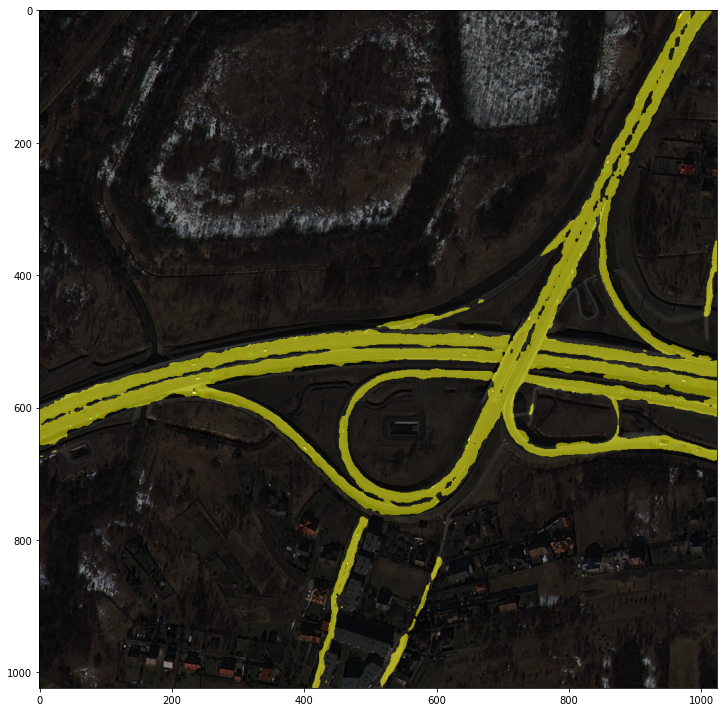

In [21]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/images/up025/OBJ00175_PS3_K3_NIA0081.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


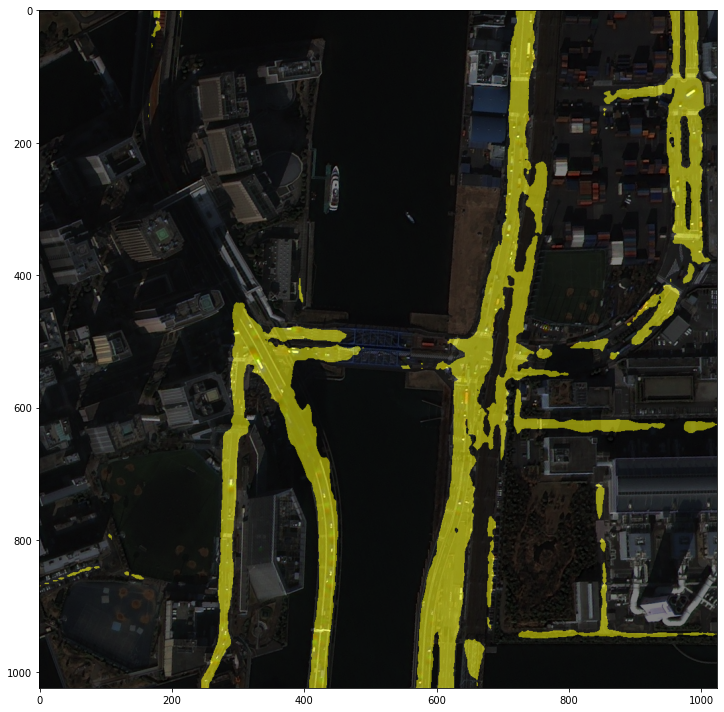

In [22]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/images/up025/OBJ00004_PS3_K3_NIA0078.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


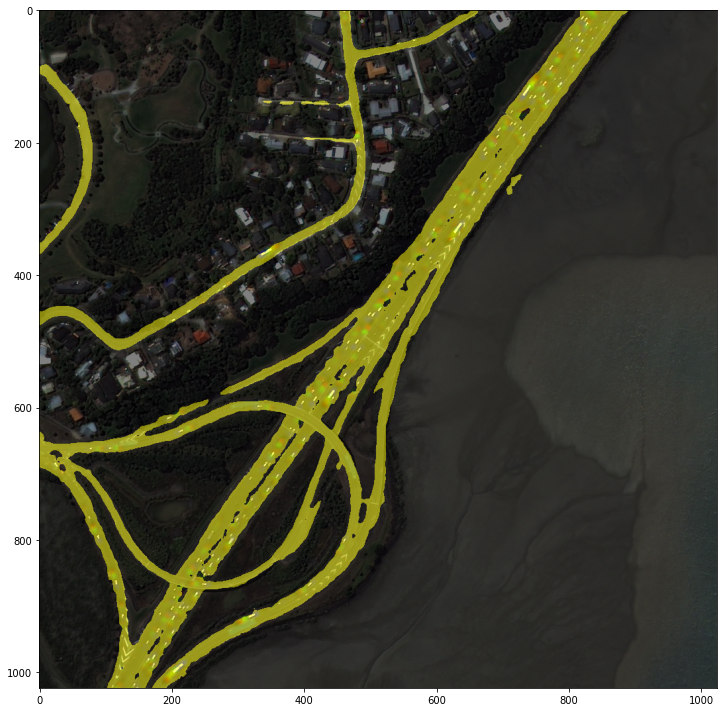

In [23]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/images/up025/OBJ01403_PS3_K3_NIA0093.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


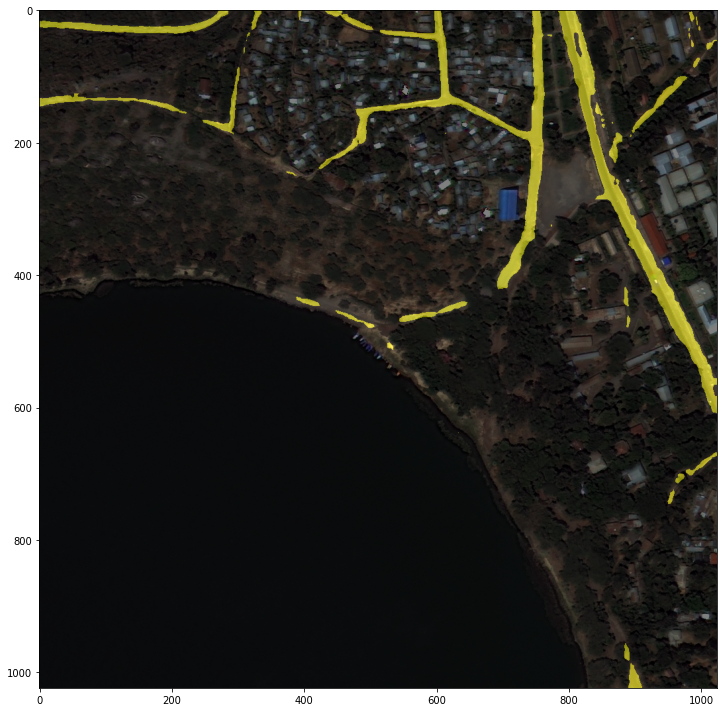

In [24]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/images/up025/OBJ02447_PS3_K3_NIA0122.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


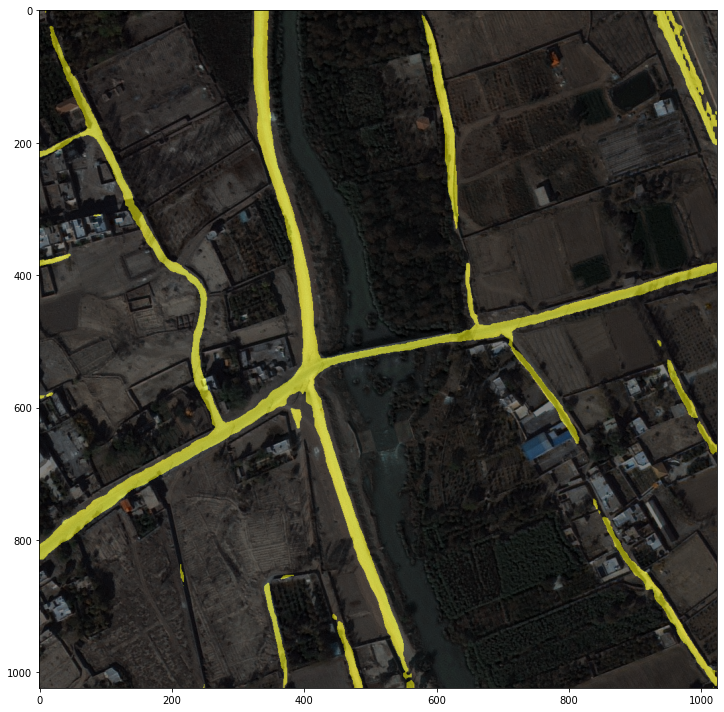

In [25]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/images/up025/OBJ03325_PS3_K3A_NIA0137.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


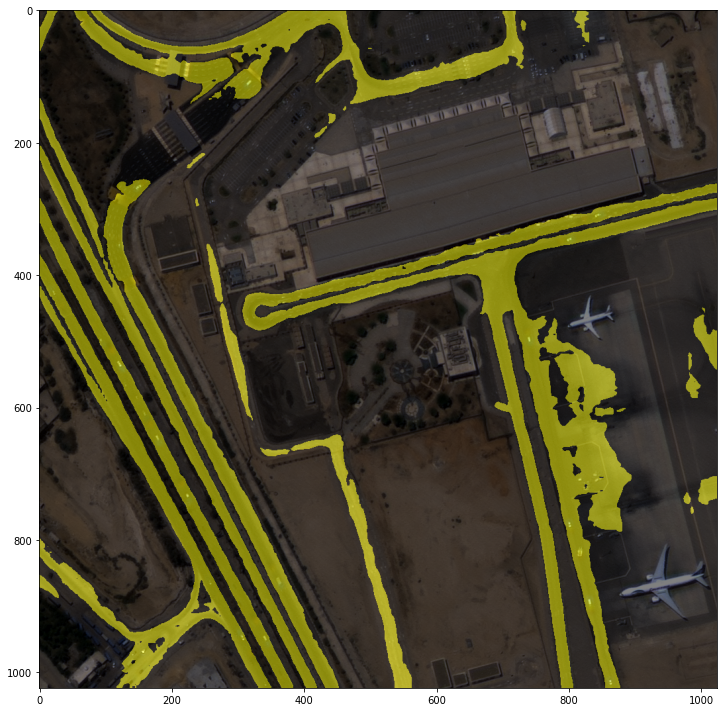

In [26]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/images/up025/BLD00768_PS3_K3A_NIA0277.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


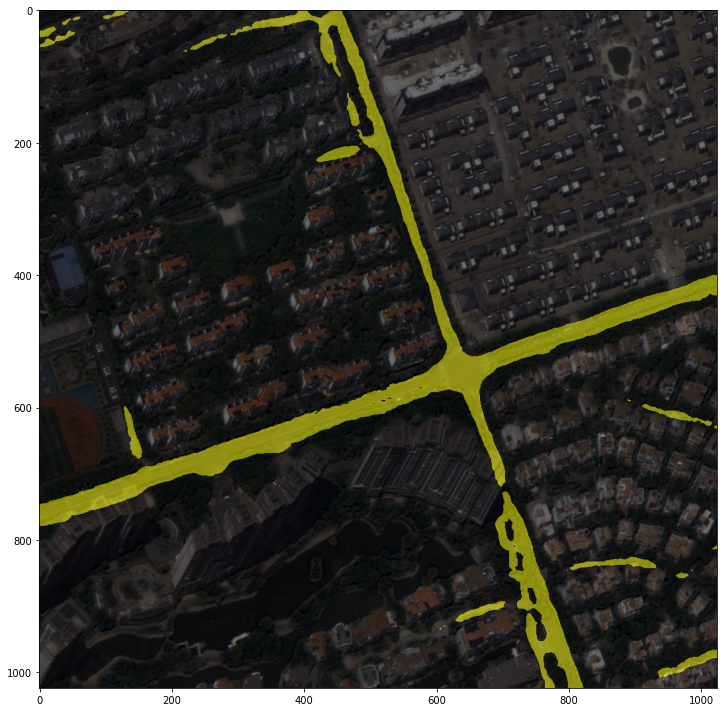

In [27]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/images/up025/BLD01556_PS3_K3A_NIA0373.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


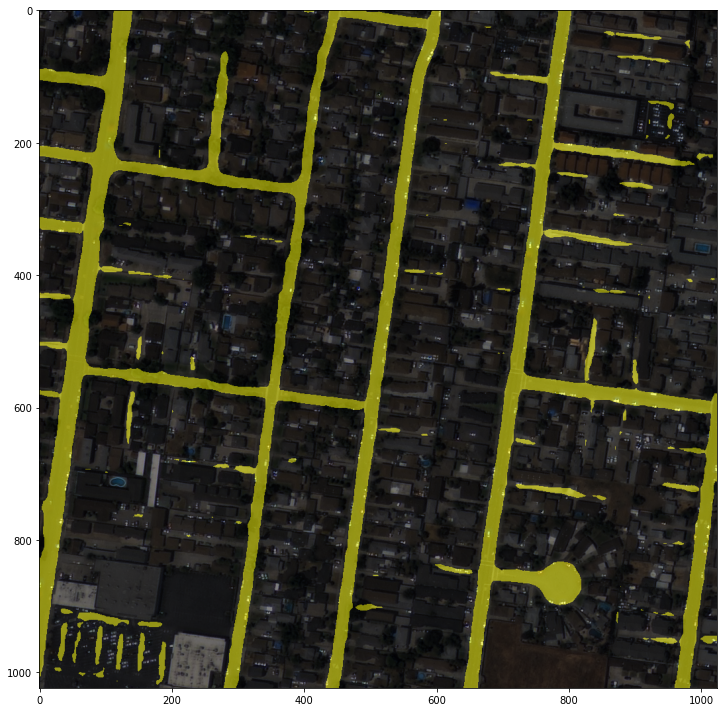

In [28]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/images/up025/BLD11632_PS3_K3A_NIA0390.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


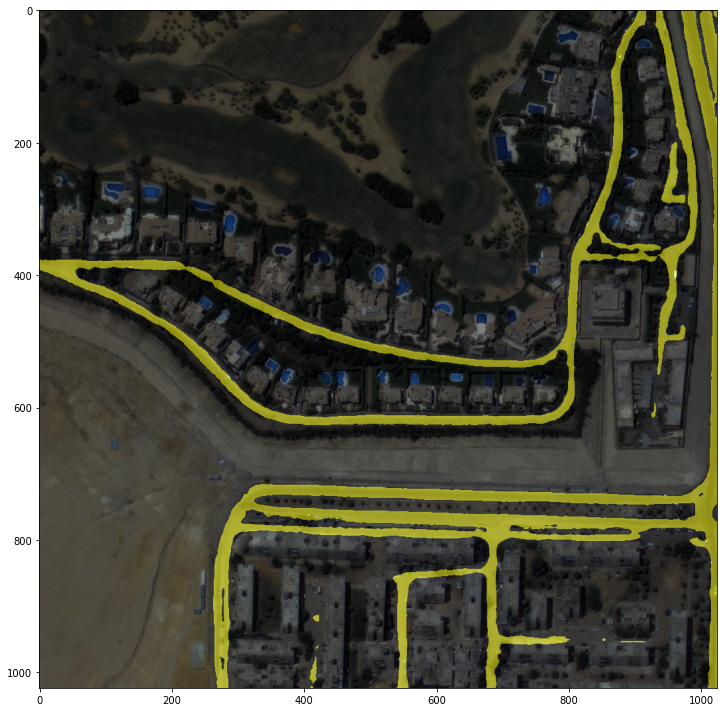

In [29]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/images/up025/BLD00223_PS3_K3A_NIA0276.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


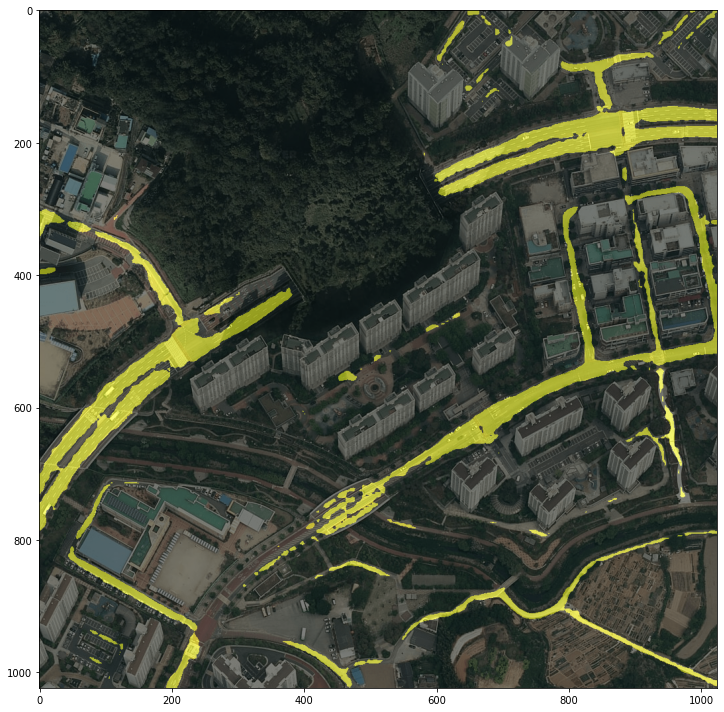

In [30]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/naver_map_images/0000.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


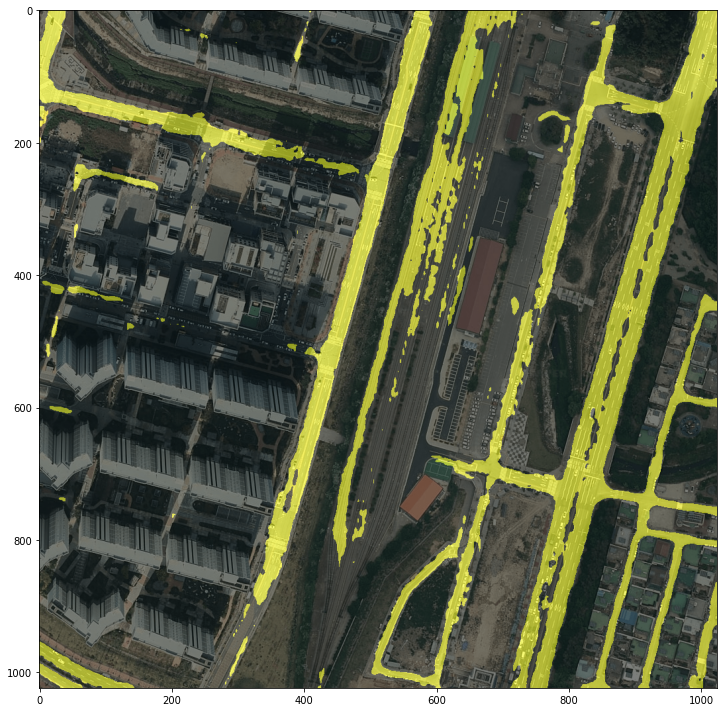

In [31]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/naver_map_images/0001.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


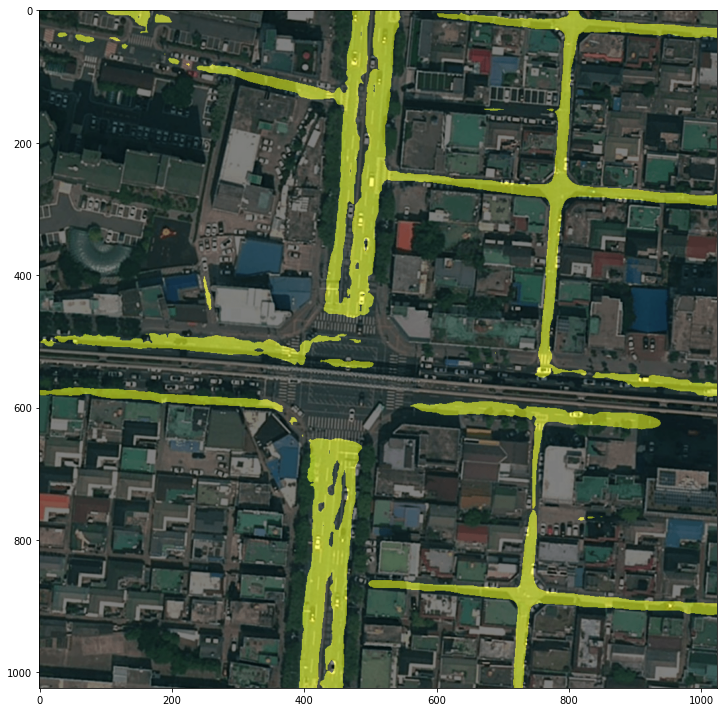

In [32]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/naver_map_images/0002.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)